# Herramienta para la implementación de sistemas multiagentes
Carlos Moisés Chávez Jiménez A01637322
17/11/2021

## Descripción del código
Simulación de la limpieza de una habitación utilizando sistemas multiagentes

### Instalación de la librería agentpy

In [1]:
import sys
sys.version

'3.9.5 (tags/v3.9.5:0a7dcbd, May  3 2021, 17:27:52) [MSC v.1928 64 bit (AMD64)]'

In [1]:
!pip install agentpy

### Importamos las librerías a utilizar

In [2]:
# Model design
import agentpy as ap

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import IPython
import random

### Declaramos la clase contiene las funciones con las que trabajaremos
- La primer función declara los agentes y la cuadricula
- La segunda función se encarga de programar el comportamiento de los agentes
- La tercera nos envía un reporte con los datos que nos interesa analizar

In [3]:
class Limpieza(ap.Model):

    # Creación de los agentes y de la habitación.
    def setup(self):
        # Create agents (cleaner)
        n_aspiradoras = int(self.p['agentes'])
        self.aspiradoras = ap.AgentList(self, n_aspiradoras)
        
        n_sucias = int(self.p['celdas sucias'] * (self.p['m'] * self.p['n']))
        self.sucias = ap.AgentList(self, n_sucias)

        temp = []
        for aspiradoras in range(n_aspiradoras):
            temp.append((0,0))
        tupla = (int(self.p['m']),int(self.p['n']))

        # Create grid (room)
        self.room = ap.Grid(self, tupla, track_empty=True)
        self.room.add_agents(self.aspiradoras, positions=temp, random=False, empty=True)
        self.room.add_agents(self.sucias, random=True, empty=True)

        self.sucias.condition = 1
        self.movimientos = 0
        unfortunate_tiles = self.room.agents[0:1, 0:1]
        unfortunate_tiles.condition = 0

    def step(self):
        # Variable contadora de movimientos de las aspiradoras
        for aspiradora in self.aspiradoras:
            for neighbor in self.room.neighbors(aspiradora, distance = 0):
                if neighbor.condition == 1:
                    neighbor.condition = 2
                    break
            else:
                # Aquí entra cuando no pasa por el break
                y = random.randint(-1, 1)
                x = random.randint(-1, 1)
                self.room.move_by(aspiradora,(x,y))
                self.movimientos += 1
        # Se detiene si ya no hay azulejos por limpiar
        dirty_tiles = self.sucias.select(self.sucias.condition == 1)
        if len(dirty_tiles) == 0:
            self.stop()
    
    def end(self):
        # Document a measure at the end of the simulation
        cleaned_tiles = len(self.sucias.select(self.sucias.condition == 2))
        self.report('Agentes',
                    len(self.aspiradoras))
        self.report('Porcentaje de celdas limpias',
                    cleaned_tiles / len(self.sucias))
        self.report('Movimientos de los agentes',
                    self.movimientos)
        self.report('Pasos',
                    self.t)

### Definimos los parametros de la cuadricula y la cantidad de pasos

In [4]:
parameters = {
    'm' : 25,
    'n' : 25,
    'celdas sucias' : 0.5,  #Porcentaje de densidad de celdas sucias
    'agentes': 15,
    'steps': 1000
}

### Declaramos la función de animación
Aqui es donde armamos la animación de la limpieza y la desplegamos.

In [5]:
def animation_plot(model, ax):
    attr_grid = model.room.attr_grid('condition')
    total = int(model.p['m']*model.p['n'])
    color_dict = {0:'#00A5D8', 1:'#711D00', 2:'#DCDCDC', None:'#D8C9BD'}
    ap.gridplot(attr_grid, ax=ax, color_dict=color_dict, convert=True)
    ax.set_title(f"Simulación de limpieza\n"
                 f"Pasos: {model.t}, Porcentaje celdas limpias: "
                 f"{round(100 - len(model.sucias.select(model.sucias.condition == 1))*100/total,2)}%", color='r')

fig, ax = plt.subplots()
model = Limpieza(parameters)
animation = ap.animate(model, fig, ax, animation_plot)
IPython.display.HTML(animation.to_jshtml(fps=15))

### Vamos a análizar las variables de la simulación.

In [7]:
parameters = {
    'm' : 25,
    'n' : 25,
    'celdas sucias' : 0.5,  #Porcentaje de densidad de celdas sucias
    'agentes': ap.Range(1, 25),
    'steps': 1000
}
sample = ap.Sample(parameters, n=30)
exp = ap.Experiment(Limpieza, sample, iterations=5)
results = exp.run()

Scheduled runs: 150
Completed: 150, estimated time remaining: 0:00:00
Experiment finished
Run time: 0:00:54.008434


In [8]:
# Save and load data
results.save()
results = ap.DataDict.load('Limpieza')

Data saved to ap_output/Limpieza_1
Loading from directory ap_output/Limpieza_1/
Loading info.json - Successful
Loading parameters_constants.json - Successful
Loading parameters_log.json - Successful
Loading parameters_sample.csv - Successful
Loading reporters.csv - Successful


### Graficamos el porcentaje de celdas limpio tomando un rango de agentes

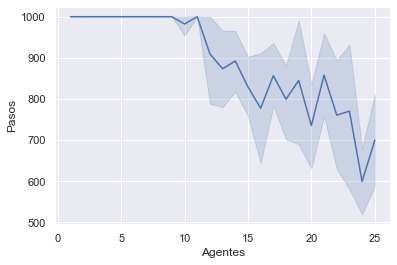

In [9]:
sns.set_theme()
sns.lineplot(
    data=results.arrange_reporters(),
    x='Agentes',
    y='Pasos'
);

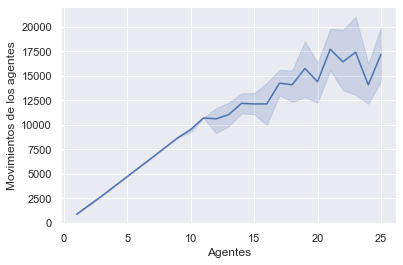

In [10]:
sns.set_theme()
sns.lineplot(
    data=results.arrange_reporters(),
    x='Agentes',
    y='Movimientos de los agentes'
);

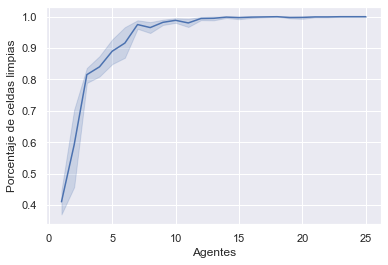

In [11]:
sns.set_theme()
sns.lineplot(
    data=results.arrange_reporters(),
    x='Agentes',
    y='Porcentaje de celdas limpias'
);